In [2]:
import numpy as np
import ndlib as nd
import networkx as nx
import matplotlib
import matplotlib.pyplot as plt
import ndlib.models.epidemics as ep
import ndlib.models.ModelConfig as mc
from ndlib.viz.mpl.DiffusionTrend import DiffusionTrend
from ndlib.viz.mpl.TrendComparison import DiffusionTrendComparison

def max_nodes(g, N):
    degrees = [val for (node, val) in g.degree()]
    inds = [node for (node, val) in g.degree()]
    dic = {}
    for key in inds:
        for value in degrees:
            dic[key] = value
            degrees.remove(value)
            break
        
    dic1 = dict(sorted(dic.items(), key=lambda dic: dic[1]))
    maxs = list(dic1.keys())[-N:]
    
    return maxs

def setSIR(g, beta, gamma, init_infected, time):
    model = ep.SIRModel(g)

    cfg = mc.Configuration()
    cfg.add_model_parameter('beta', beta) # infection rate
    cfg.add_model_parameter('gamma', gamma) # recovery rate

    cfg.add_model_parameter("percentage_infected", init_infected)
    model.set_initial_status(cfg)

    iterations = model.iteration_bunch(time, node_status=True)
    trends = model.build_trends(iterations)
    
    return iterations, trends

def setSIR_custom_init(g, beta, gamma, infected_arr, time):
    model = ep.SIRModel(g)

    cfg = mc.Configuration()
    cfg.add_model_parameter('beta', beta) # infection rate
    cfg.add_model_parameter('gamma', gamma) # recovery rate

    cfg.add_model_initial_configuration("Infected", infected_nodes)
    model.set_initial_status(cfg)

    iterations = model.iteration_bunch(time, node_status=True)
    trends = model.build_trends(iterations)
    
    return iterations, trends

def getInfecteds(trends):
    return list(trends[0].get('trends').get('node_count').values())[1]

def normalize(array, norm):
    return np.divide(array, norm)

def vacc(g, n_vaccs):
    nodes = max_nodes(g, n_vaccs)
    g.remove_nodes_from(nodes)
    
    return g
    
def vacc_rand(g, n_vaccs):
    size = g.number_of_nodes()
    nodes = np.random.randint(1, size, n_vaccs)
    g.remove_nodes_from(nodes)
    
    return g


no display found. Using non-interactive Agg backend
no display found. Using non-interactive Agg backend


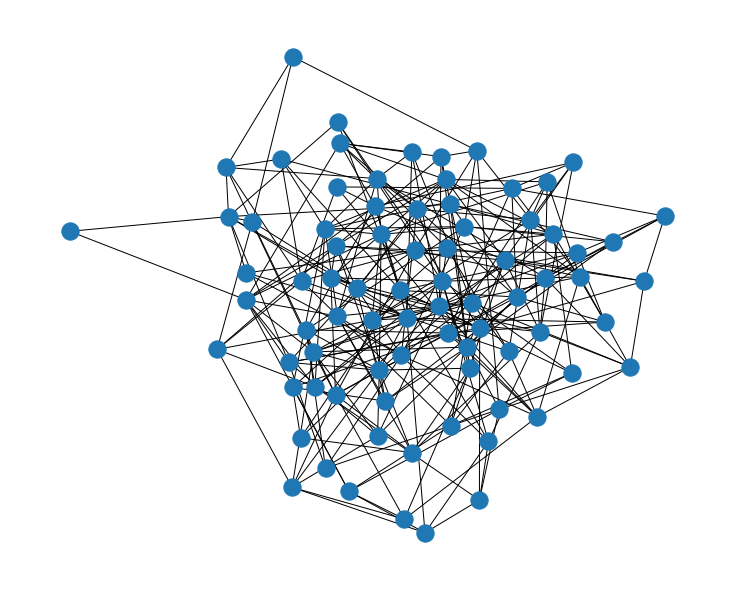

In [51]:
''' SIR on a graph example '''

size = 80
p = 0.1

g = nx.erdos_renyi_graph(size, p)

time = 500
prcnt_inf = 0.02
beta, gamma = 0.01, 0.005

model = ep.SIRModel(g)

cfg = mc.Configuration()
cfg.add_model_parameter('beta', beta) # infection rate
cfg.add_model_parameter('gamma', gamma) # recovery rate

cfg.add_model_parameter("percentage_infected", prcnt_inf)
model.set_initial_status(cfg)

iterations = model.iteration_bunch(time, node_status=True)
trends = model.build_trends(iterations)

%matplotlib inline
plt.figure()
viz = DiffusionTrend(model, trends)
viz.plot('SIRonNetwork_plot_example')

matplotlib.use('QtAgg')

%matplotlib inline
plt.figure(figsize=(10, 8))
nx.draw(g)
plt.savefig('SIR_graph_example')

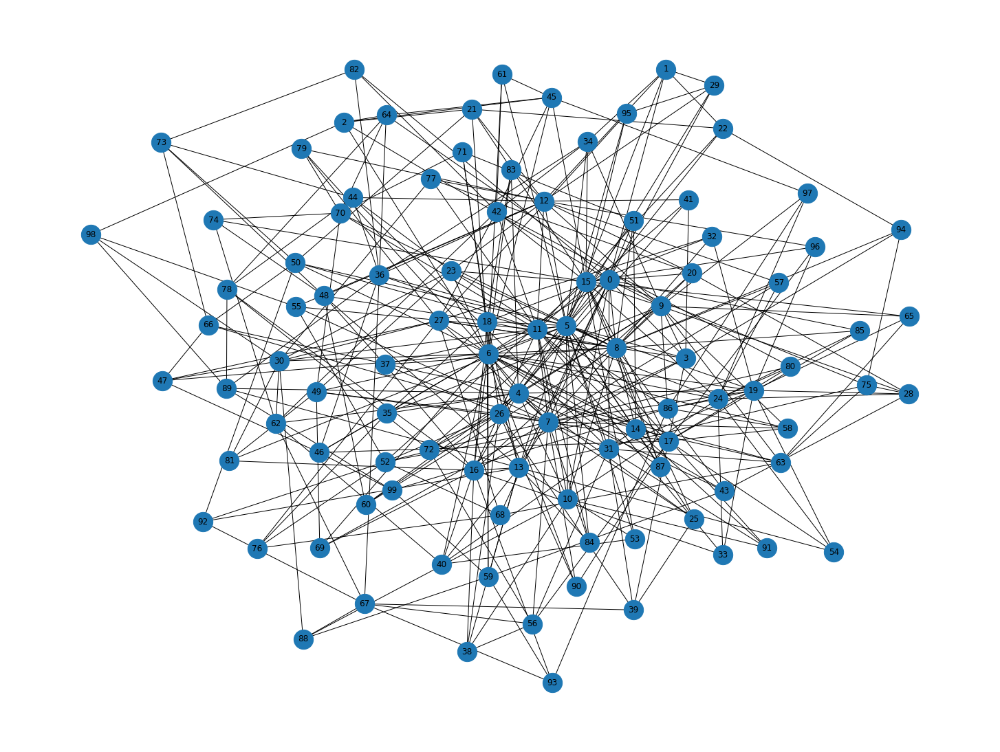

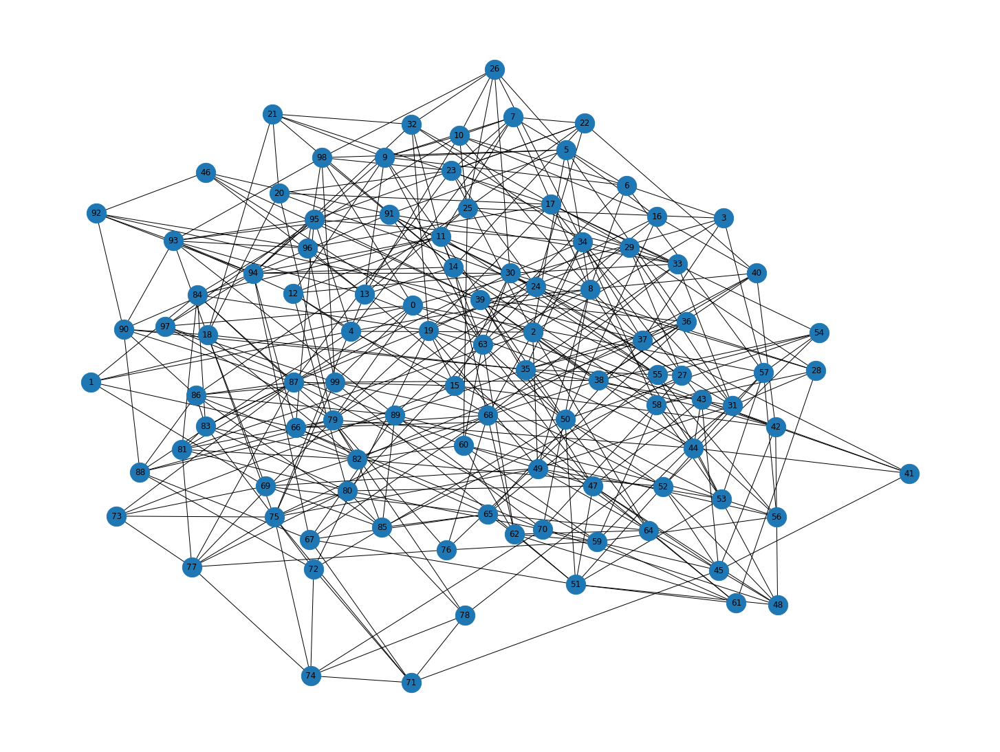

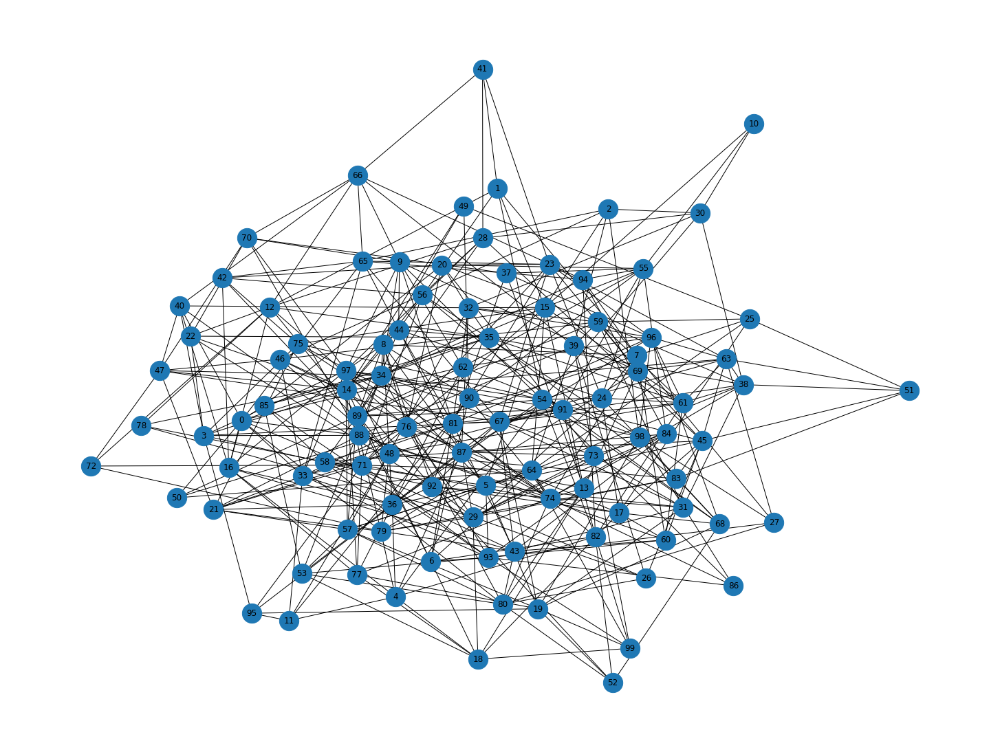

In [160]:
%matplotlib inline

g1 = nx.barabasi_albert_graph(100, 4)
fig = plt.figure(1, figsize=(20, 15))
nx.draw(g1, with_labels=True, font_weight='normal', node_size=800, width=1)
plt.savefig('BA_example1')
plt.show()

g2 = nx.watts_strogatz_graph(100, 8, 0.5)
fig = plt.figure(1, figsize=(20, 15))
nx.draw(g2, with_labels=True, font_weight='normal', node_size=800, width=1)
plt.savefig('WS_example1')
plt.show()

g3 = nx.erdos_renyi_graph(100, 0.08)
fig = plt.figure(1, figsize=(20, 15))
nx.draw(g3, with_labels=True, font_weight='normal', node_size=800, width=1)
plt.savefig('ER_example1')
plt.show()

In [161]:
print(g1.number_of_edges(), g2.number_of_edges(), g3.number_of_edges())

384 400 429


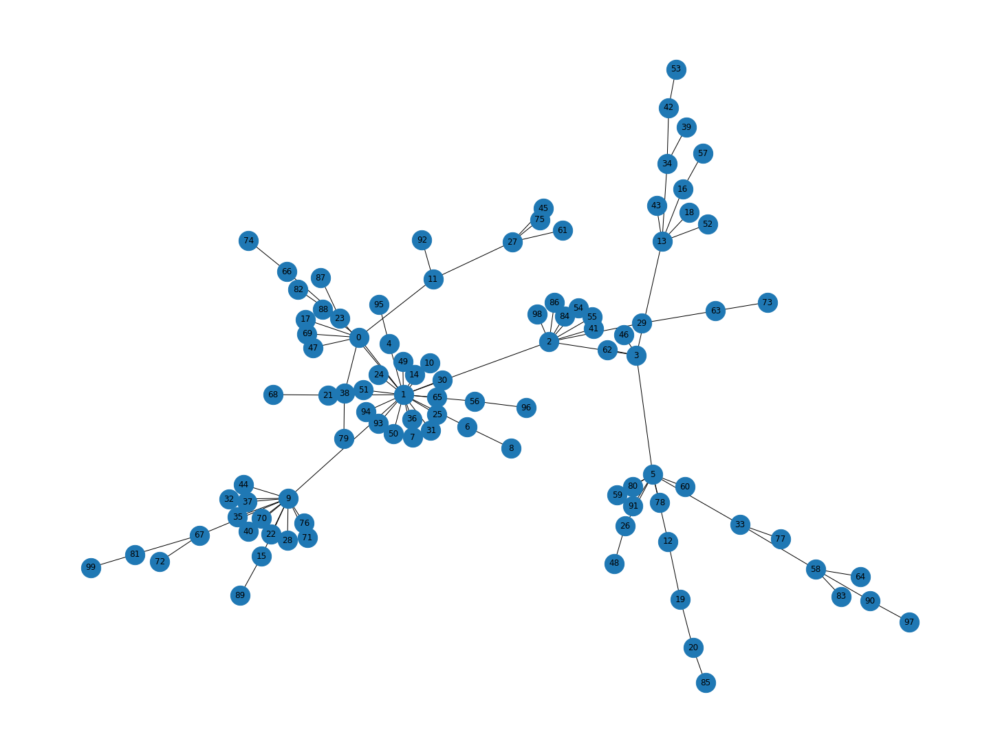

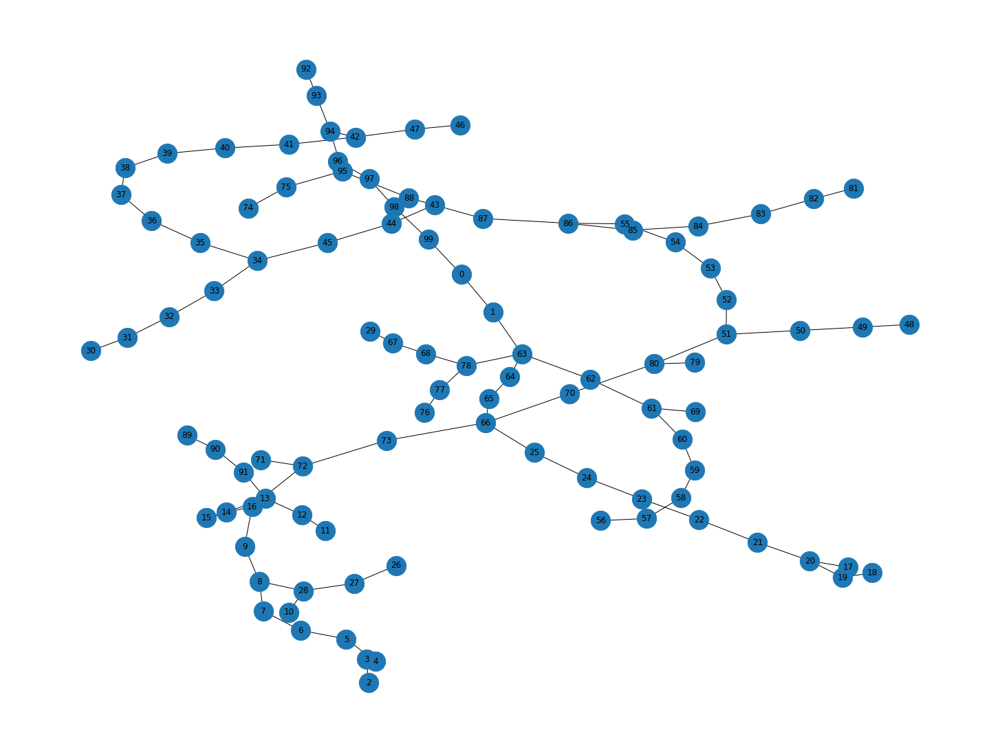

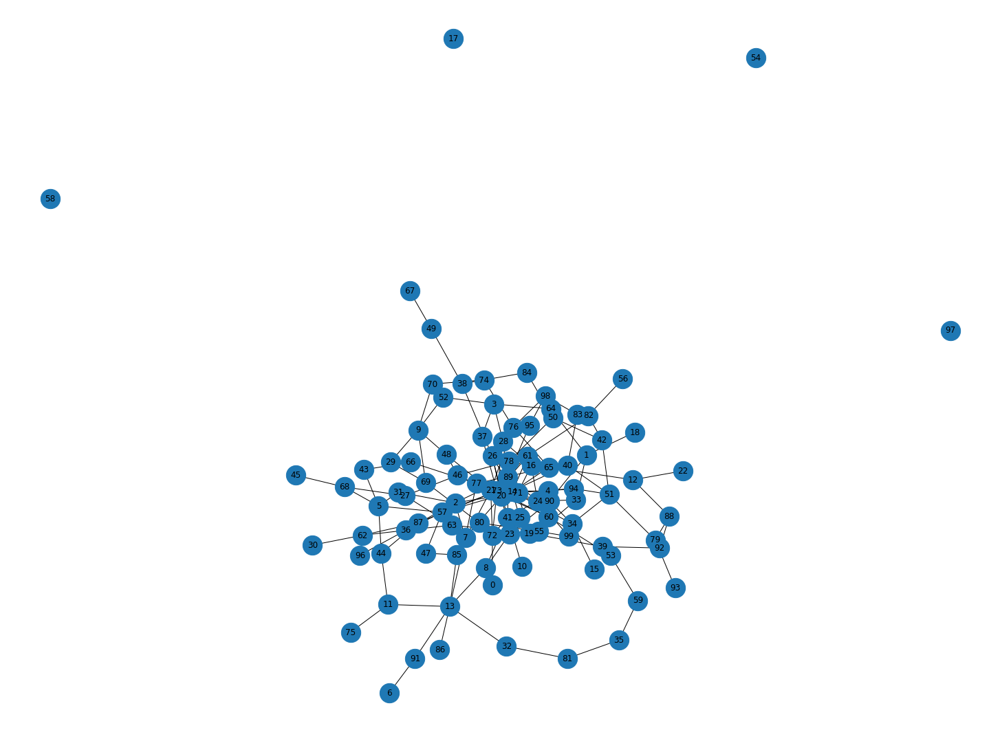

In [165]:
%matplotlib inline

g11 = nx.barabasi_albert_graph(100, 1)
fig = plt.figure(1, figsize=(20, 15))
nx.draw(g11, with_labels=True, font_weight='normal', node_size=800, width=1)
plt.savefig('BA_example2')
plt.show()


g22 = nx.watts_strogatz_graph(100, 2, 0.3)
fig = plt.figure(1, figsize=(20, 15))
nx.draw(g22, with_labels=True, font_weight='normal', node_size=800, width=1)
plt.savefig('WS_example2')
plt.show()

g33 = nx.erdos_renyi_graph(100, 0.03)
fig = plt.figure(1, figsize=(20, 15))
nx.draw(g33, with_labels=True, font_weight='normal', node_size=800, width=1)
plt.savefig('ER_example2')
plt.show()


2079 2000 1968


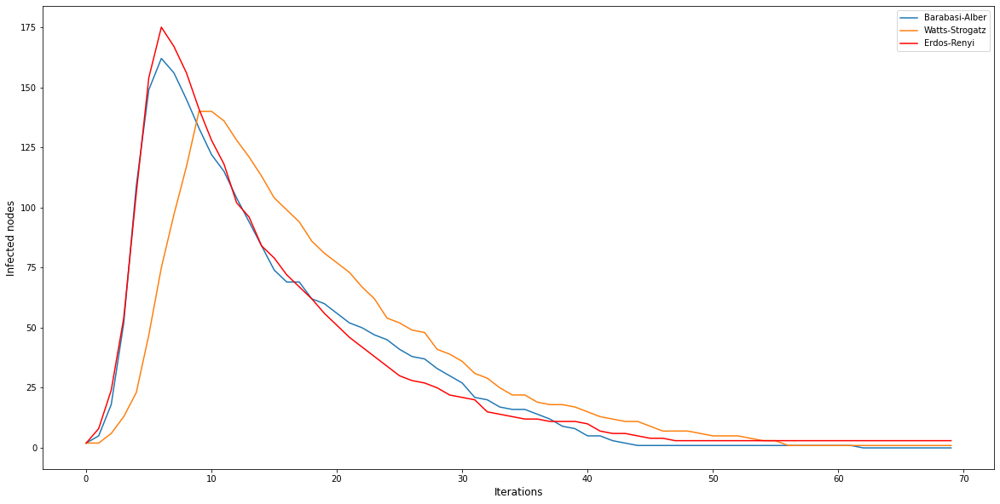

In [143]:
''' (a) Models comparison '''

size = 200
k = 11
p = 0.05

gba = nx.barabasi_albert_graph(size, k)
gws = nx.watts_strogatz_graph(size, 20, p)
ger = nx.erdos_renyi_graph(size, 0.1)


beta, gamma = 0.1, 0.08
init_infected = 0.01 # proportion
t = 70 # number of iterations

ba_iters, ba_trends = setSIR(gba, beta, gamma, init_infected, t)
ws_iters, ws_trends = setSIR(gws, beta, gamma, init_infected, t)
er_iters, er_trends = setSIR(ger, beta, gamma, init_infected, t)

%matplotlib inline
plt.figure(figsize=(20, 10))
plt.plot(getInfecteds(ba_trends), label='Barabasi-Alber')
plt.plot(getInfecteds(ws_trends), label='Watts-Strogatz')
plt.plot(getInfecteds(er_trends), 'r', label='Erdos-Renyi')
plt.xlabel('Iterations', fontsize='large')
plt.ylabel('Infected nodes', fontsize='large')
plt.legend()
plt.savefig("Comparison_example")

print(gba.number_of_edges(), gws.number_of_edges(), ger.number_of_edges())

In [76]:
iarr, ba_arr, ws_arr, er_arr = [], [], [], []
t = 500
for i in range(t):
    ba_iters, ba_trends = setSIR(gba, beta, gamma, init_infected, t)
    ws_iters, ws_trends = setSIR(gws, beta, gamma, init_infected, t)
    er_iters, er_trends = setSIR(ger, beta, gamma, init_infected, t)
    
    ba_maxinf = max(normalize(getInfecteds(ba_trends), size))
    ws_maxinf = max(normalize(getInfecteds(ws_trends), size))
    er_maxinf = max(normalize(getInfecteds(er_trends), size))
     
    iarr.append(i)
    ba_arr.append(ba_maxinf)
    ws_arr.append(ws_maxinf)
    er_arr.append(er_maxinf)

ba_avg = np.average(ba_arr); ws_avg = np.average(ws_arr); er_avg = np.average(er_arr)
ba_avgs, ws_avgs, er_avgs = [], [], []
for i in range(t):
    ba_avgs.append(ba_avg)
    ws_avgs.append(ws_avg)
    er_avgs.append(er_avg)
    

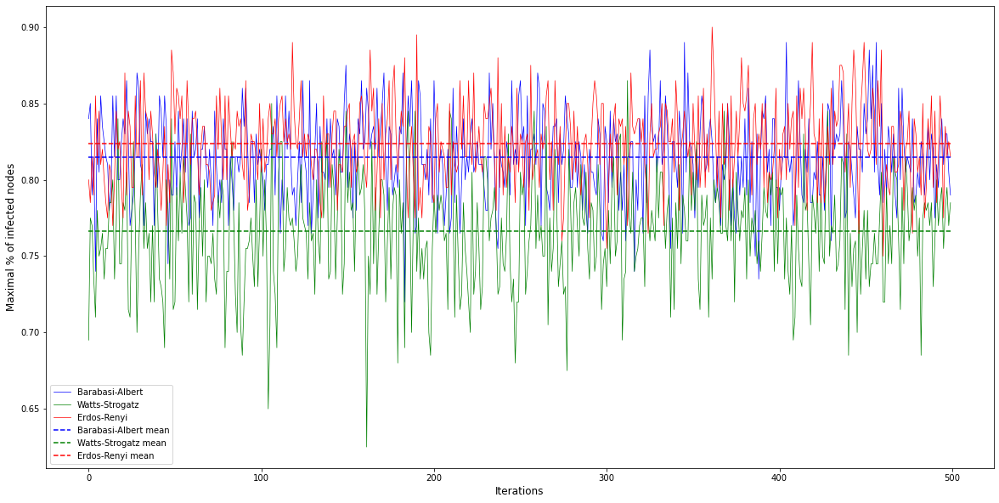

In [77]:
plt.figure(figsize=(20,10))
plt.plot(iarr, ba_arr, 'b', linewidth=0.7, label='Barabasi-Albert')
plt.plot(iarr, ws_arr, 'g', linewidth=0.7, label='Watts-Strogatz')
plt.plot(iarr, er_arr, 'r', linewidth=0.7, label='Erdos-Renyi')

plt.plot(iarr, ba_avgs, 'b', linestyle='dashed', label='Barabasi-Albert mean')
plt.plot(iarr, ws_avgs, 'g', linestyle='dashed', label='Watts-Strogatz mean')
plt.plot(iarr, er_avgs, 'r', linestyle='dashed', label='Erdos-Renyi mean')

plt.xlabel('Iterations', fontsize='large')
plt.ylabel('Maximal % of infected nodes', fontsize='large')
plt.legend()
plt.savefig("Comparison_full")

In [78]:
print(ba_avg, ws_avg, er_avg)

0.8145800000000001 0.76615 0.8236800000000001


0.959
0.946


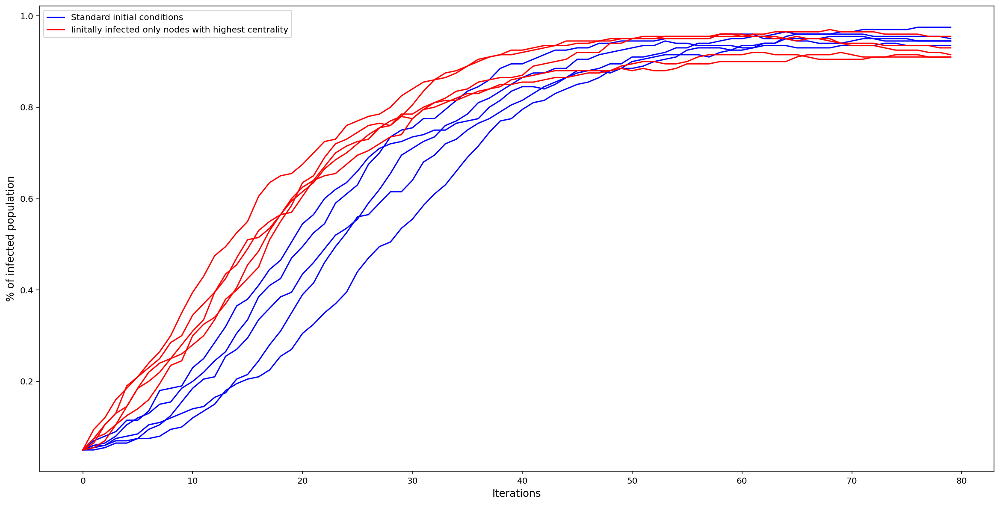

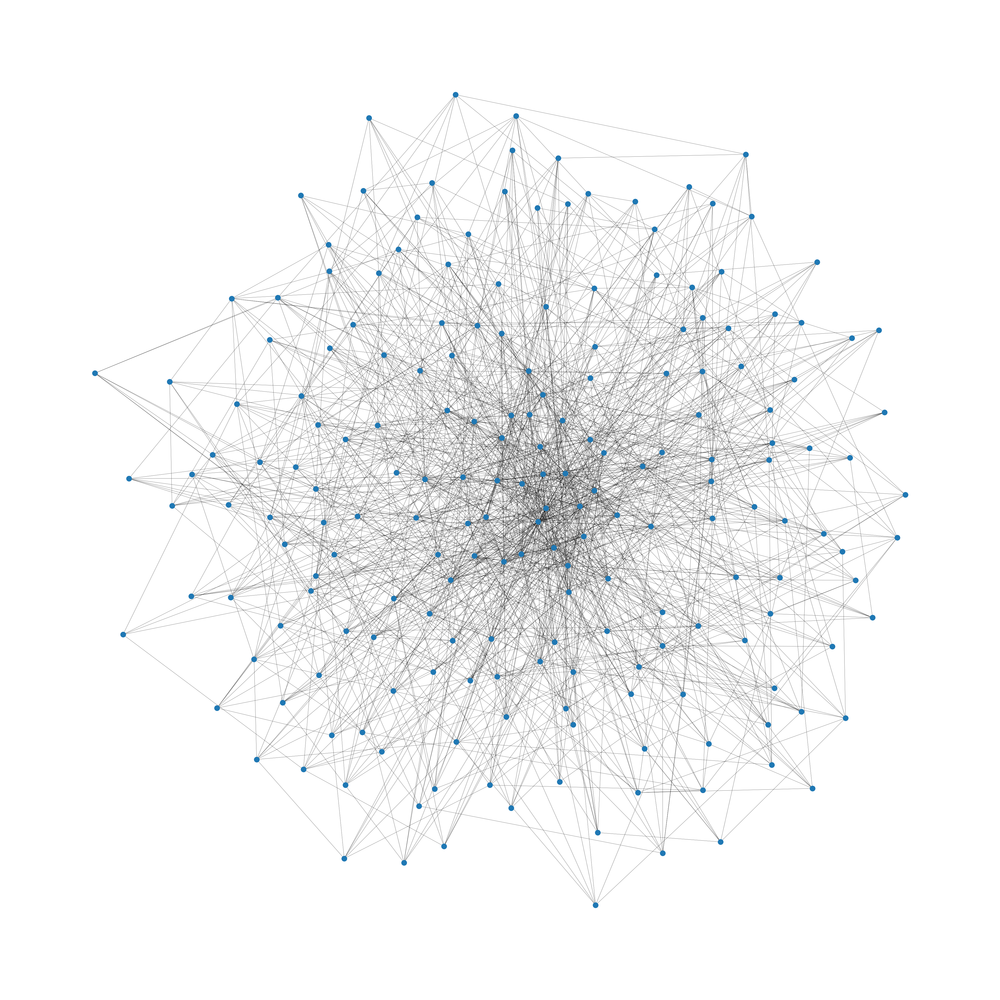

In [134]:
''' (b) Nodes' degrees and sread of infection '''

size = 200
k = 7
p = 0.04

g = nx.barabasi_albert_graph(size, k)

plt.figure(figsize=(20,10))
n = 10
prcnt_inf = n / size
time = 80

beta = 0.01
gamma = 0.001

avg1_arr = []
for i in range(5):
    iterations, trends = setSIR(g.copy(), beta, gamma, prcnt_inf, time)
    arr1 = normalize(getInfecteds(trends), size)
    
    avg1_arr.append(max(arr1))
    if i ==0:  plt.plot(arr1, 'b', label='Standard initial conditions')
    else: plt.plot(arr1, 'b')
        
avg1 = sum(avg1_arr) / len(avg1_arr)

avg2_arr = []
for i in range(5):  
    infected_nodes = max_nodes(g.copy(), n)
    iterations, trends = setSIR_custom_init(g.copy(), beta, gamma, infected_nodes, time)
    arr2 = normalize(getInfecteds(trends), size)

    avg2_arr.append(max(arr2))
    if i ==0:  plt.plot(arr2,'r', label='Iinitally infected only nodes with highest centrality')
    else: plt.plot(arr2,'r')
        
avg2 = sum(avg2_arr) / len(avg2_arr)   

plt.legend()
plt.xlabel('Iterations', fontsize = 'large')
plt.ylabel('% of infected population', fontsize = 'large')
plt.savefig("degrees_infection_plot")
plt.show()

print(avg1)
print(avg2)

matplotlib.use('QtAgg')

plt.figure(figsize=(10,10), dpi=200)
nx.draw(g, font_weight='normal', node_size=10, width=0.1)
plt.savefig("degrees_infection_graph")
plt.show()

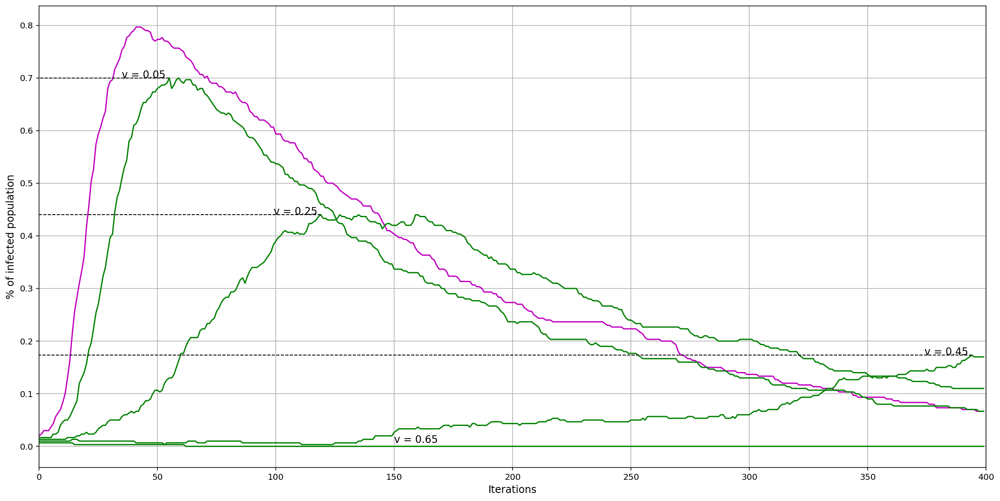

In [127]:
""" (c) Vaccination """

size = 300
k = 10
beta, gamma = 0.01, 0.007
prcnt_inf = 0.02
time = 400


g = nx.barabasi_albert_graph(size, k)


%matplotlib inline
matplotlib.use('QtAgg')
fig = plt.figure(figsize=(20, 10))


iterations1, trends1 = setSIR(g, beta, gamma, prcnt_inf, time)

arr1 = normalize(getInfecteds(trends1), size)
plt.plot(arr1, 'm', label = 'Without vaccination')


v = np.arange(0.05, 0.7, 0.2)
for i in v:
    prop_vacc = i
    N = int(round(size * prop_vacc))
    
    g2 = vacc(g.copy(), N)
    
    iterations2, trends2 = setSIR(g2, beta, gamma, prcnt_inf, time)

    arr2 = normalize(getInfecteds(trends2), size)
    

    plt.plot(arr2, 'g', label = 'Targeted vaccination')

    vtext = 'v = ' + str(round(prop_vacc,2))
    
    maxx = max(arr2)
    maxind = np.unravel_index(np.argmax(arr2, axis=None), arr2.shape)[0]
    
    if maxind > 50:
        plt.text(maxind - 20, maxx, vtext, fontsize='large')
        plt.hlines(y=maxx, xmin=maxind, xmax=0, linewidth=1, color='k', linestyle = 'dashed')
    else:
        plt.text(150, maxx, vtext, fontsize='large')
        plt.hlines(y=maxx, xmin=maxind, xmax=0, linewidth=1, color='k', linestyle = 'dashed')
    
plt.xlabel('Iterations', fontsize = 'large')
plt.ylabel('% of infected population', fontsize = 'large')
plt.xlim(0, time)
plt.grid()
plt.savefig("Vaccination_example")
plt.show()    

In [131]:
size = 300
k = 10
beta, gamma = 0.01, 0.007
prcnt_inf = 0.02
time = 400

g = nx.barabasi_albert_graph(size, k)

errs = []
maxs_avg_arr = []
v = np.arange(0, 1, 0.1)
for j in v:
    prop_vacc = j 
    N = int(round(size * prop_vacc))
    
    maxs = []
    for i in range(100):
        g2 = vacc_rand(g.copy(), N)
        
        iterations, trends = setSIR(g2, beta, gamma, prcnt_inf, time)
        
        arr2 = normalize(getInfecteds(trends), size)
        maxs.append(max(arr2))
    maxs_avg = sum(maxs) / len(maxs)
    maxs_avg_arr.append(maxs_avg)

In [132]:
print(maxs_avg_arr)

[0.8227, 0.7273, 0.6468333333333334, 0.5768666666666669, 0.5065666666666668, 0.44466666666666677, 0.3937666666666666, 0.3361, 0.2961000000000001, 0.2614666666666666]


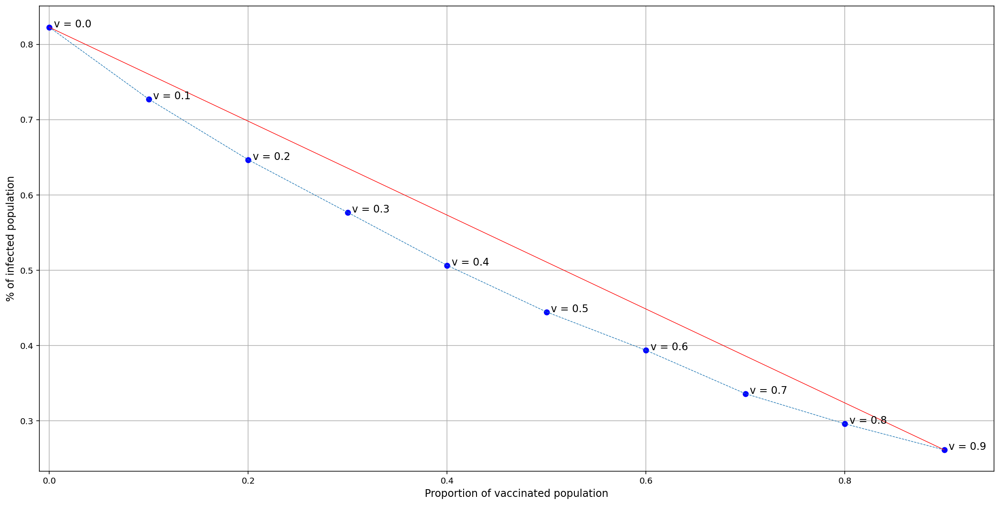

In [133]:
%matplotlib inline
matplotlib.use('QtAgg')
fig = plt.figure(figsize=(20, 10))
plt.plot(v, maxs_avg_arr, 'bo')
plt.plot(v, maxs_avg_arr, linestyle='dashed', linewidth=0.7)

liney = [maxs_avg_arr[0], maxs_avg_arr[-1]]
linex = [v[0], v[-1]]
plt.plot(linex, liney, 'r', linewidth=0.7)

for i in range(len(v)):
    vtext = 'v = ' + str(round(v[i],2))
    plt.text(v[i]+0.0045, maxs_avg_arr[i], vtext, fontsize='large')
    
plt.xlim(-0.01,0.95)
plt.xlabel('Proportion of vaccinated population', fontsize='large')
plt.ylabel('% of infected population', fontsize='large')
plt.grid()
plt.savefig("Effectivness_of_vaccination")